In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import folium
%matplotlib inline

In [3]:
os.chdir(r'C:\Users\kojaejeung\Desktop\데이터시각화프로젝트\data')

In [4]:
case_data = pd.read_csv('Case.csv')
case_data.head()

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,133.0,37.538621,126.992652
1,1000002,Seoul,Guro-gu,True,Guro-gu Call Center,99.0,37.508163,126.884387
2,1000003,Seoul,Dongdaemun-gu,True,Dongan Church,20.0,37.592888,127.056766
3,1000004,Seoul,Guro-gu,True,Manmin Central Church,41.0,37.481059,126.894343
4,1000005,Seoul,Eunpyeong-gu,True,Eunpyeong St. Mary's Hospital,14.0,37.63369,126.9165


In [5]:
infection_case_confirmed_counts = case_data.groupby('infection_case')['confirmed'].sum().sort_values(ascending=False)
infection_case_confirmed_counts[:10]

infection_case
Shincheonji Church                 5212.0
contact with patient               1236.0
etc                                1068.0
overseas inflow                     886.0
Itaewon Clubs                       253.0
Second Mi-Ju Hospital               196.0
Guro-gu Call Center                 167.0
Hansarang Convalescent Hospital     128.0
Cheongdo Daenam Hospital            123.0
Coupang Logistics Center            109.0
Name: confirmed, dtype: float64

[Text(0, 0, 'Shincheonji Church'),
 Text(0, 0, 'contact with patient'),
 Text(0, 0, 'etc'),
 Text(0, 0, 'overseas inflow'),
 Text(0, 0, 'Itaewon Clubs'),
 Text(0, 0, 'Second Mi-Ju Hospital'),
 Text(0, 0, 'Guro-gu Call Center'),
 Text(0, 0, 'Hansarang Convalescent Hospital'),
 Text(0, 0, 'Cheongdo Daenam Hospital'),
 Text(0, 0, 'Coupang Logistics Center')]

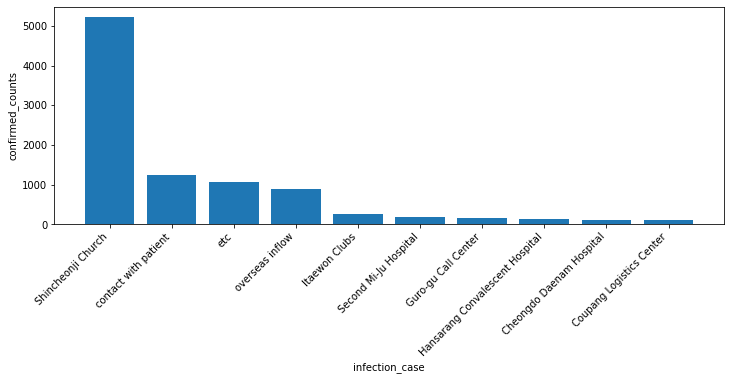

In [6]:
# 감염경로별 누적확진자 수 top10 barplot 시각화
# 그룹감염자인지 아닌지는 감염경로명을 보면 대략적으로 파악할 수 있다.
fig, ax = plt.subplots(figsize=(12,4))
idx = [i for i in range(10)]
ax.bar(idx,infection_case_confirmed_counts[:10])
ax.set_xlabel('infection_case')
ax.set_ylabel('confirmed_counts')
ax.set_xticks(idx)
ax.set_xticklabels(['Shincheonji Church','contact with patient','etc','overseas inflow',
                    'Itaewon Clubs','Second Mi-Ju Hospital','Guro-gu Call Center','Hansarang Convalescent Hospital',
                    'Cheongdo Daenam Hospital','Coupang Logistics Center'], rotation=45, ha='right' )

In [7]:
time_age = pd.read_csv('TimeAge.csv')
time_age.info()
time_age.nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 819 entries, 0 to 818
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       819 non-null    object
 1   time       819 non-null    int64 
 2   age        819 non-null    object
 3   confirmed  819 non-null    int64 
 4   deceased   819 non-null    int64 
dtypes: int64(3), object(2)
memory usage: 32.1+ KB


date          91
time           1
age            9
confirmed    624
deceased      98
dtype: int64

In [8]:
time_age.tail(10)
time_age.head(10)

,date,time,age,confirmed,deceased
0,2020-03-02,0,0s,32,0
1,2020-03-02,0,10s,169,0
2,2020-03-02,0,20s,1235,0
3,2020-03-02,0,30s,506,1
4,2020-03-02,0,40s,633,1
5,2020-03-02,0,50s,834,5
6,2020-03-02,0,60s,530,6
7,2020-03-02,0,70s,192,6
8,2020-03-02,0,80s,81,3
9,2020-03-03,0,0s,34,0


In [9]:
# 일별 연령대별 누적 확진자 그래프 만들기 (라인그래프로 나이대별 비교)

In [10]:
time_group = time_age.groupby(['date','age'])[['confirmed','deceased']].sum()
time_group.head(10)
time_group.reset_index(inplace=True)
time_group

,date,age,confirmed,deceased
0,2020-03-02,0s,32,0
1,2020-03-02,10s,169,0
2,2020-03-02,20s,1235,0
3,2020-03-02,30s,506,1
4,2020-03-02,40s,633,1
...,...,...,...,...
814,2020-05-31,40s,1521,3
815,2020-05-31,50s,2039,15
816,2020-05-31,60s,1405,39
817,2020-05-31,70s,725,80


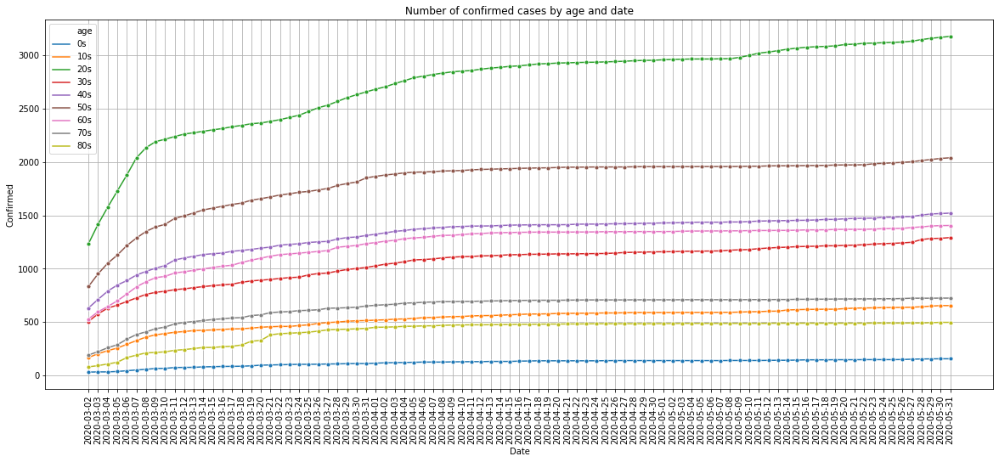

In [11]:
# 날짜별 누적확진자 그래프
plt.figure(figsize=(20,8))
sns.lineplot(data=time_group, x='date',y='confirmed',hue='age', marker='o', markersize=5)
plt.xticks(rotation=90)
plt.grid()
plt.xlabel('Date')
plt.ylabel('Confirmed')
plt.title('Number of confirmed cases by age and date')
plt.show()

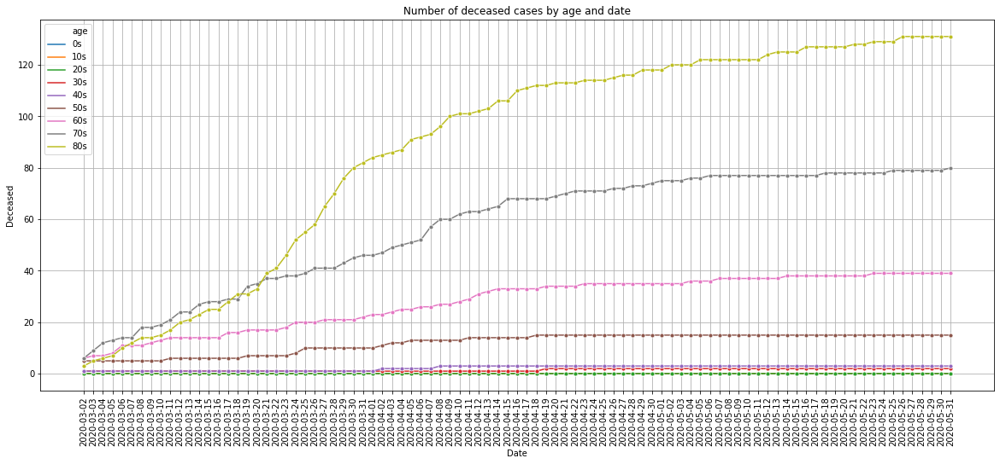

In [12]:
# 날짜별 누적 사망자 그래프
plt.figure(figsize=(20,8))
sns.lineplot(data=time_group, x='date',y='deceased',hue='age', marker='o',markersize=5)
plt.xticks(rotation=90)
plt.grid()
plt.xlabel('Date')
plt.ylabel('Deceased')
plt.title('Number of deceased cases by age and date')
plt.show()

In [13]:
# 일별 연령대별 확진자 그래프 만들기 (당일기록 (연령대별))

In [14]:
# 0대 당일 확진자, 당일 사망자 전처리 과정.
time_0s = time_group[time_group['age'] == '0s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_0s)-1):
    day_confirmed.append(time_0s.loc[i,'confirmed'] - time_0s.loc[i+1,'confirmed'])

day_deceased = []
for i in range(len(time_0s)-1):
    day_deceased.append(time_0s.loc[i,'deceased'] - time_0s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_0s = time_0s.drop(time_0s.tail(1).index)
time_0s['day_confirmed'] = day_confirmed
time_0s['day_deceased'] = day_deceased
time_0s = time_0s[::-1].reset_index(drop=True)
display(time_0s)


# 10대 당일 확진자, 당일 사망자 전처리 과정.
time_10s = time_group[time_group['age'] == '10s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_10s)-1):
    day_confirmed.append(time_10s.loc[i,'confirmed'] - time_10s.loc[i+1,'confirmed'])

day_deceased = []
for i in range(len(time_10s)-1):
    day_deceased.append(time_10s.loc[i,'deceased'] - time_10s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_10s = time_10s.drop(time_10s.tail(1).index)
time_10s['day_confirmed'] = day_confirmed
time_10s['day_deceased'] = day_deceased
time_10s = time_10s[::-1].reset_index(drop=True)
display(time_10s)

# 20대 당일 확진자, 당일 사망자 전처리 과정.
time_20s = time_group[time_group['age'] == '20s'][::-1].reset_index(drop=True)
# display(time_20s)
day_confirmed = []
for i in range(len(time_20s)-1):
    day_confirmed.append(time_20s.loc[i,'confirmed'] - time_20s.loc[i+1,'confirmed'])
# time_20s
day_deceased = []
for i in range(len(time_20s)-1):
    day_deceased.append(time_20s.loc[i,'deceased'] - time_20s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_20s = time_20s.drop(time_20s.tail(1).index)
time_20s['day_confirmed'] = day_confirmed
time_20s['day_deceased'] = day_deceased
time_20s = time_20s[::-1].reset_index(drop=True)
display(time_20s)

# 30대 당일 확진자, 당일 사망자 전처리 과정.
time_30s = time_group[time_group['age'] == '30s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_30s)-1):
    day_confirmed.append(time_30s.loc[i,'confirmed'] - time_30s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_30s)-1):
    day_deceased.append(time_30s.loc[i,'deceased'] - time_30s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_30s = time_30s.drop(time_30s.tail(1).index)
time_30s['day_confirmed'] = day_confirmed
time_30s['day_deceased'] = day_deceased
time_30s = time_30s[::-1].reset_index(drop=True)
display(time_30s)

# 40대 당일 확진자, 당일 사망자 전처리 과정.
time_40s = time_group[time_group['age'] == '40s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_40s)-1):
    day_confirmed.append(time_40s.loc[i,'confirmed'] - time_40s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_40s)-1):
    day_deceased.append(time_40s.loc[i,'deceased'] - time_40s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_40s = time_40s.drop(time_40s.tail(1).index)
time_40s['day_confirmed'] = day_confirmed
time_40s['day_deceased'] = day_deceased
time_40s = time_40s[::-1].reset_index(drop=True)
display(time_40s)

# 50대 당일 확진자, 당일 사망자 전처리 과정.
time_50s = time_group[time_group['age'] == '50s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_50s)-1):
    day_confirmed.append(time_50s.loc[i,'confirmed'] - time_50s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_50s)-1):
    day_deceased.append(time_50s.loc[i,'deceased'] - time_50s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_50s = time_50s.drop(time_50s.tail(1).index)
time_50s['day_confirmed'] = day_confirmed
time_50s['day_deceased'] = day_deceased
time_50s = time_50s[::-1].reset_index(drop=True)
display(time_50s)

# 60대 당일 확진자, 당일 사망자 전처리 과정.
time_60s = time_group[time_group['age'] == '60s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_60s)-1):
    day_confirmed.append(time_60s.loc[i,'confirmed'] - time_60s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_60s)-1):
    day_deceased.append(time_60s.loc[i,'deceased'] - time_60s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_60s = time_60s.drop(time_60s.tail(1).index)
time_60s['day_confirmed'] = day_confirmed
time_60s['day_deceased'] = day_deceased
time_60s = time_60s[::-1].reset_index(drop=True)
display(time_60s)

# 70대 당일 확진자, 당일 사망자 전처리 과정.
time_70s = time_group[time_group['age'] == '70s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_70s)-1):
    day_confirmed.append(time_70s.loc[i,'confirmed'] - time_70s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_70s)-1):
    day_deceased.append(time_70s.loc[i,'deceased'] - time_70s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_70s = time_70s.drop(time_70s.tail(1).index)
time_70s['day_confirmed'] = day_confirmed
time_70s['day_deceased'] = day_deceased
time_70s = time_70s[::-1].reset_index(drop=True)
display(time_70s)

# 80대 당일 확진자, 당일 사망자 전처리 과정.
time_80s = time_group[time_group['age'] == '80s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_80s)-1):
    day_confirmed.append(time_80s.loc[i,'confirmed'] - time_80s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_80s)-1):
    day_deceased.append(time_80s.loc[i,'deceased'] - time_80s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_80s = time_80s.drop(time_80s.tail(1).index)
time_80s['day_confirmed'] = day_confirmed
time_80s['day_deceased'] = day_deceased
time_80s = time_80s[::-1].reset_index(drop=True)
display(time_80s)

,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,0s,34,0,2,0
1,2020-03-04,0s,34,0,0,0
2,2020-03-05,0s,38,0,4,0
3,2020-03-06,0s,45,0,7,0
4,2020-03-07,0s,52,0,7,0
...,...,...,...,...,...,...
85,2020-05-27,0s,153,0,3,0
86,2020-05-28,0s,155,0,2,0
87,2020-05-29,0s,156,0,1,0
88,2020-05-30,0s,157,0,1,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,10s,204,0,35,0
1,2020-03-04,10s,233,0,29,0
2,2020-03-05,10s,257,0,24,0
3,2020-03-06,10s,292,0,35,0
4,2020-03-07,10s,327,0,35,0
...,...,...,...,...,...,...
85,2020-05-27,10s,640,0,2,0
86,2020-05-28,10s,644,0,4,0
87,2020-05-29,10s,650,0,6,0
88,2020-05-30,10s,655,0,5,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,20s,1417,0,182,0
1,2020-03-04,20s,1575,0,158,0
2,2020-03-05,20s,1727,0,152,0
3,2020-03-06,20s,1877,0,150,0
4,2020-03-07,20s,2038,0,161,0
...,...,...,...,...,...,...
85,2020-05-27,20s,3131,0,8,0
86,2020-05-28,20s,3146,0,15,0
87,2020-05-29,20s,3158,0,12,0
88,2020-05-30,20s,3167,0,9,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,30s,578,1,72,0
1,2020-03-04,30s,631,1,53,0
2,2020-03-05,30s,659,1,28,0
3,2020-03-06,30s,693,1,34,0
4,2020-03-07,30s,727,1,34,0
...,...,...,...,...,...,...
85,2020-05-27,30s,1248,2,6,0
86,2020-05-28,30s,1274,2,26,0
87,2020-05-29,30s,1283,2,9,0
88,2020-05-30,30s,1285,2,2,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,40s,713,1,80,0
1,2020-03-04,40s,790,1,77,0
2,2020-03-05,40s,847,1,57,0
3,2020-03-06,40s,889,1,42,0
4,2020-03-07,40s,941,1,52,0
...,...,...,...,...,...,...
85,2020-05-27,40s,1489,3,3,0
86,2020-05-28,40s,1503,3,14,0
87,2020-05-29,40s,1513,3,10,0
88,2020-05-30,40s,1517,3,4,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,50s,952,5,118,0
1,2020-03-04,50s,1051,5,99,0
2,2020-03-05,50s,1127,5,76,0
3,2020-03-06,50s,1217,5,90,0
4,2020-03-07,50s,1287,5,70,0
...,...,...,...,...,...,...
85,2020-05-27,50s,2002,15,6,0
86,2020-05-28,50s,2014,15,12,0
87,2020-05-29,50s,2023,15,9,0
88,2020-05-30,50s,2033,15,10,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,60s,597,7,67,1
1,2020-03-04,60s,646,7,49,0
2,2020-03-05,60s,699,8,53,1
3,2020-03-06,60s,763,11,64,3
4,2020-03-07,60s,830,11,67,0
...,...,...,...,...,...,...
85,2020-05-27,60s,1386,39,8,0
86,2020-05-28,60s,1392,39,6,0
87,2020-05-29,60s,1400,39,8,0
88,2020-05-30,60s,1404,39,4,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,70s,224,9,32,3
1,2020-03-04,70s,260,12,36,3
2,2020-03-05,70s,288,13,28,1
3,2020-03-06,70s,340,14,52,1
4,2020-03-07,70s,384,14,44,0
...,...,...,...,...,...,...
85,2020-05-27,70s,724,79,3,0
86,2020-05-28,70s,724,79,0,0
87,2020-05-29,70s,724,79,0,0
88,2020-05-30,70s,725,79,1,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,80s,93,5,12,2
1,2020-03-04,80s,108,6,15,1
2,2020-03-05,80s,124,7,16,1
3,2020-03-06,80s,168,10,44,3
4,2020-03-07,80s,191,12,23,2
...,...,...,...,...,...,...
85,2020-05-27,80s,492,131,1,0
86,2020-05-28,80s,492,131,0,0
87,2020-05-29,80s,495,131,3,0
88,2020-05-30,80s,498,131,3,0


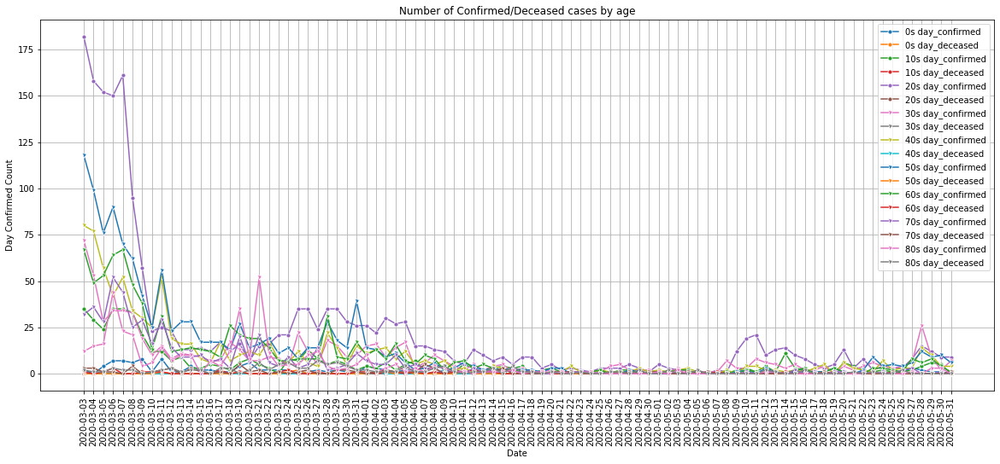

In [15]:
# 시각화 코드..
plt.figure(figsize=(20,8))
# 0대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_0s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '0s day_confirmed')
sns.lineplot(data = time_0s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '0s day_deceased')
# 10대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_10s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '10s day_confirmed')
sns.lineplot(data = time_10s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '10s day_deceased')
# 20대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_20s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '20s day_confirmed')
sns.lineplot(data = time_20s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '20s day_deceased')
# 30대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_30s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '30s day_confirmed')
sns.lineplot(data = time_30s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '30s day_deceased')
# 40대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_40s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '40s day_confirmed')
sns.lineplot(data = time_40s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '40s day_deceased')
# 50대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_50s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '50s day_confirmed')
sns.lineplot(data = time_50s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '50s day_deceased')
# 60대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_60s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '60s day_confirmed')
sns.lineplot(data = time_60s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '60s day_deceased')
# 70대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_70s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '70s day_confirmed')
sns.lineplot(data = time_70s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '70s day_deceased')
# 80대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_80s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '80s day_confirmed')
sns.lineplot(data = time_80s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '80s day_deceased')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Confirmed/Deceased cases by age')
plt.legend()
plt.grid()
plt.show()

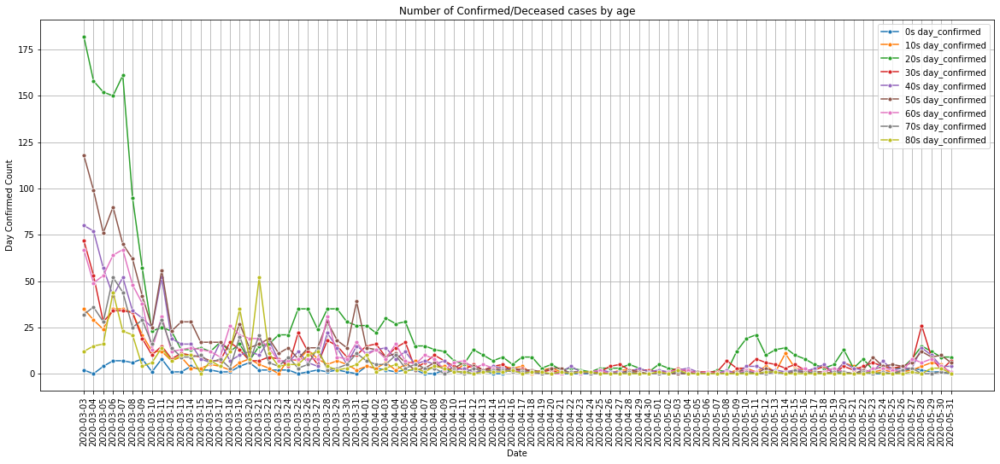

In [16]:
plt.figure(figsize=(20,8))
sns.lineplot(data = time_0s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '0s day_confirmed')
sns.lineplot(data = time_10s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '10s day_confirmed')
sns.lineplot(data = time_20s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '20s day_confirmed')
sns.lineplot(data = time_30s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '30s day_confirmed')
sns.lineplot(data = time_40s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '40s day_confirmed')
sns.lineplot(data = time_50s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '50s day_confirmed')
sns.lineplot(data = time_60s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '60s day_confirmed')
sns.lineplot(data = time_70s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '70s day_confirmed')
sns.lineplot(data = time_80s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '80s day_confirmed')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Confirmed/Deceased cases by age')
plt.legend()
plt.grid()
plt.show()

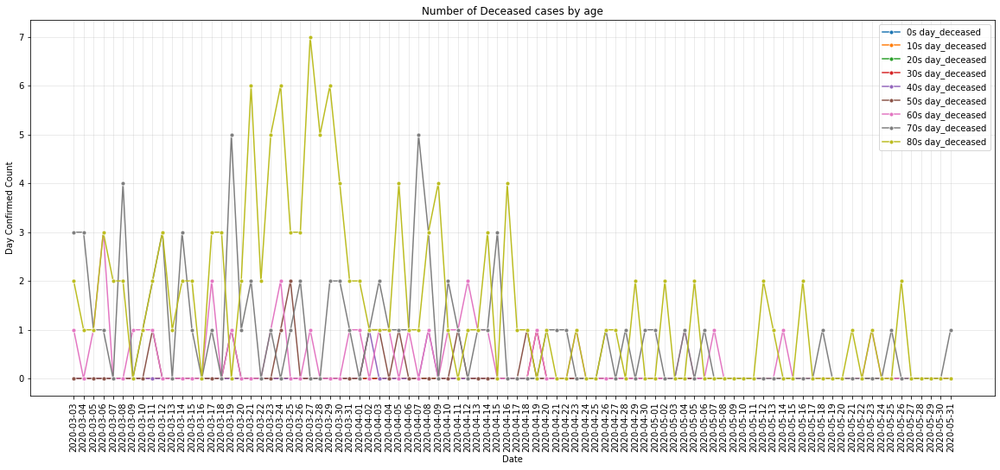

In [17]:
plt.figure(figsize=(20,8))
sns.lineplot(data = time_0s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '0s day_deceased')
sns.lineplot(data = time_10s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '10s day_deceased')
sns.lineplot(data = time_20s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '20s day_deceased')
sns.lineplot(data = time_30s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '30s day_deceased')
sns.lineplot(data = time_40s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '40s day_deceased')
sns.lineplot(data = time_50s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '50s day_deceased')
sns.lineplot(data = time_60s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '60s day_deceased')
sns.lineplot(data = time_70s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '70s day_deceased')
sns.lineplot(data = time_80s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '80s day_deceased')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Deceased cases by age')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [18]:
preprocess_time_age = time_age[-9:]
preprocess_time_age = preprocess_time_age[['age','confirmed','deceased']]
preprocess_time_age

,age,confirmed,deceased
810,0s,157,0
811,10s,655,0
812,20s,3176,0
813,30s,1292,2
814,40s,1521,3
815,50s,2039,15
816,60s,1405,39
817,70s,725,80
818,80s,498,131


C:\Users\kojaejeung\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  """
C:\Users\kojaejeung\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  


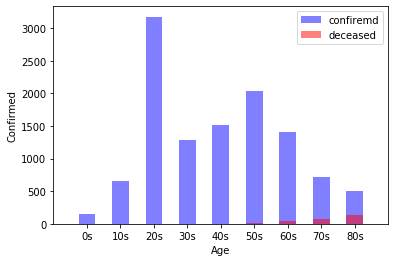

In [19]:
# 연령대 별 누적확진자 수(Blue) // 사망자 수(Red)
width = 0.5
idx = [i for i in range(len(preprocess_time_age))]
fig, ax = plt.subplots()
ax.bar(idx, preprocess_time_age['confirmed'], width, color='B', alpha=0.5, label='confiremd')
ax.bar(idx, preprocess_time_age['deceased'], width, color='R', alpha=0.5, label='deceased')
ax.set_xlabel('Age')
ax.set_ylabel('Confirmed')
ax.set_xlim(-1,9)
ax.set_xticks(idx)
ax.set_xticklabels(preprocess_time_age['age'])
ax.legend()


In [20]:
# patient_info 와 patient_route 데이터 patient_id 를 키로 merge 시킨다.
patient_info = pd.read_csv('PatientInfo.csv')
display(patient_info.head())
patient_route = pd.read_csv('PatientRoute.csv')
patient_route.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964,50s,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987,30s,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964,50s,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2002000001,17,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991,20s,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992,20s,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1000000002,2,NaN,2020-01-31,2020-02-24,NaN,released


,patient_id,global_num,date,province,city,type,latitude,longitude
0,1000000001,2.0,2020-01-22,Gyeonggi-do,Gimpo-si,airport,37.615246,126.715632
1,1000000001,2.0,2020-01-24,Seoul,Jung-gu,hospital,37.567241,127.005659
2,1000000002,5.0,2020-01-25,Seoul,Seongbuk-gu,etc,37.592560,127.017048
3,1000000002,5.0,2020-01-26,Seoul,Seongbuk-gu,store,37.591810,127.016822
4,1000000002,5.0,2020-01-26,Seoul,Seongdong-gu,public_transportation,37.563992,127.029534


In [21]:
# 중복된 환자 ID는 없어 보인다.
print(f"데이터 행의 수 = {patient_info.shape[0]}")
print(f"고유한 환자 ID 수 = {patient_info['patient_id'].nunique()}")

데이터 행의 수 = 4004
고유한 환자 ID 수 = 4004


In [22]:
# patient_info 전처리
patient_info = patient_info[['patient_id','sex','age','country','province','infection_case','contact_number','state']]

In [23]:
# 결측치 확인.
# 환자 id는 결측치 없고, infection_case는 결측치 존재..
# 추후 infection_case의 결측치는 etc와 함께 분류.
patient_info.isnull().sum()

patient_id           0
sex                330
age                479
country              0
province             0
infection_case     793
contact_number    3324
state                0
dtype: int64

In [24]:
# 감염 경로의 가지수.
patient_info['infection_case'].nunique()

29

In [25]:
# infection_case의 결측값을 제외한 환자의 수.
res = patient_info.groupby('infection_case')['patient_id'].count().sum()
print('감염 경로 결측값 제외한 환자의 수',res)
res = patient_info.groupby('infection_case')['patient_id'].count()
print('감염 경로별 환자의 수\n',res)
# reset_index 명령으로 인덱스를 보통의 자료열로 바꿀 수도 있다. 
# 이 때 인덱스 열은 자료열의 가장 선두로 삽입된다. 
# 데이터프레임의 인덱스는 정수로 된 디폴트 인덱스로 바뀐다.
res = res.reset_index()
# 내림차순 정렬
res = res.sort_values('patient_id', ascending=False)
res

감염 경로 결측값 제외한 환자의 수 3211
감염 경로별 환자의 수
 infection_case
Bonghwa Pureun Nursing Home                31
Changnyeong Coin Karaoke                    4
Cheongdo Daenam Hospital                   21
Coupang Logistics Center                   70
Dongan Church                              17
Eunpyeong St. Mary's Hospital              16
Geochang Church                             6
Guri Collective Infection                   6
Guro-gu Call Center                       112
Gyeongsan Cham Joeun Community Center      10
Gyeongsan Jeil Silver Town                 12
Gyeongsan Seorin Nursing Home              15
Itaewon Clubs                             156
KB Life Insurance                           8
Milal Shelter                              11
Ministry of Oceans and Fisheries           28
Onchun Church                              33
Pilgrimage to Israel                        2
River of Grace Community Church             1
Samsung Medical Center                      7
Seongdong-gu APT          

,infection_case,patient_id
24,contact with patient,1182
28,overseas inflow,703
25,etc,601
12,Itaewon Clubs,156
8,Guro-gu Call Center,112
21,Shincheonji Church,107
3,Coupang Logistics Center,70
16,Onchun Church,33
0,Bonghwa Pureun Nursing Home,31
26,gym facility in Cheonan,30


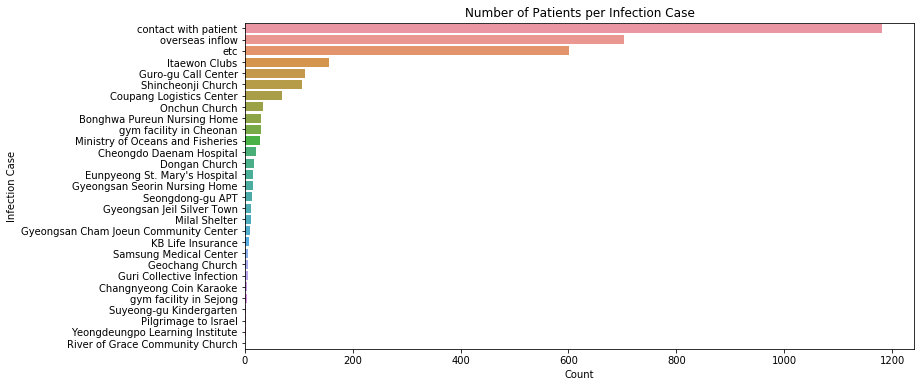

In [26]:
plt.figure(figsize=(12,6))
sns.barplot(y='infection_case', x='patient_id', data=res)
plt.xlabel('Count')
plt.ylabel('Infection Case')
plt.title('Number of Patients per Infection Case')
plt.show()

Unknown       1394
Individual    1182
Group          725
Overseas       703
Name: infection_case, dtype: int64
        index  infection_case
0     Unknown            1394
1  Individual            1182
2       Group             725
3    Overseas             703
  infection_cause  patient_counts
0         Unknown            1394
1      Individual            1182
2           Group             725
3        Overseas             703


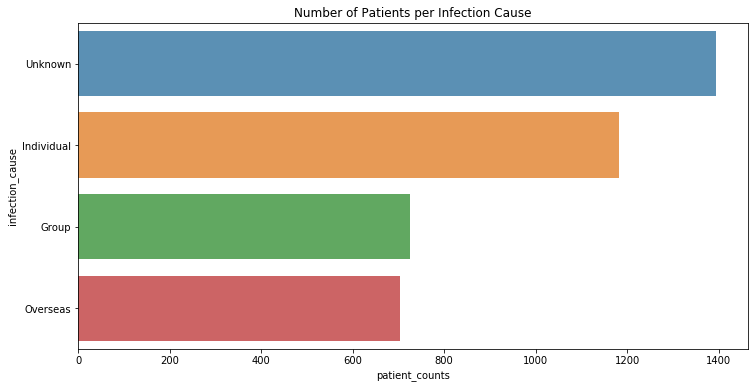

In [27]:
my_dict = {'contact with patient':'Individual', 
           'etc':'Unknown', 'overseas inflow':'Overseas'}
# 
def transe(x):
    if not pd.isnull(x):
        if x in my_dict.keys():
            return my_dict[x]
        else:
            return "Group"
    else:
        return "Unknown"
    
res = patient_info['infection_case'].apply(transe)
# print(res)
patient_info['infection_cause'] = res
res = res.value_counts().sort_values(ascending=False)
print(res)
res = res.reset_index()
print(res)
res.rename(columns={'index':'infection_cause','infection_case':'patient_counts'}, inplace=True)
print(res)
plt.figure(figsize = (12,6))
sns.barplot(y = 'infection_cause', x= 'patient_counts', data = res, alpha=0.8)
plt.xlabel('patient_counts')
plt.ylabel('infection_cause')
plt.title('Number of Patients per Infection Cause')
plt.show()

In [28]:
patient_route = pd.read_csv('PatientRoute.csv')
patient_route.head()

,patient_id,global_num,date,province,city,type,latitude,longitude
0,1000000001,2.0,2020-01-22,Gyeonggi-do,Gimpo-si,airport,37.615246,126.715632
1,1000000001,2.0,2020-01-24,Seoul,Jung-gu,hospital,37.567241,127.005659
2,1000000002,5.0,2020-01-25,Seoul,Seongbuk-gu,etc,37.592560,127.017048
3,1000000002,5.0,2020-01-26,Seoul,Seongbuk-gu,store,37.591810,127.016822
4,1000000002,5.0,2020-01-26,Seoul,Seongdong-gu,public_transportation,37.563992,127.029534


In [29]:
# 결측치의 총 카운트.
patient_route.isnull().sum().sum()

3264

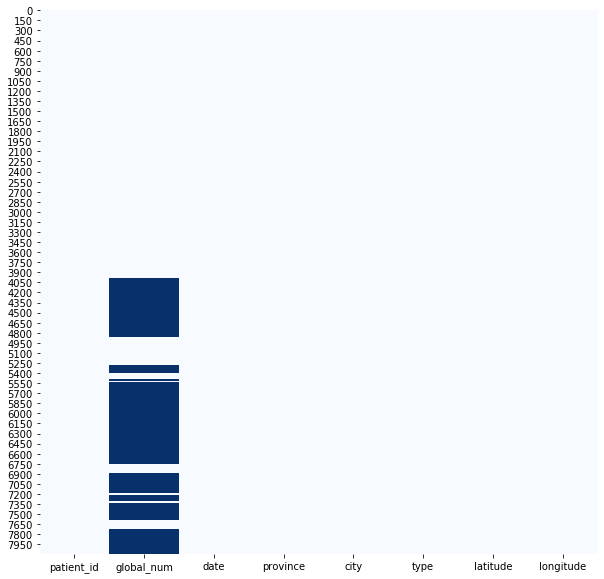

In [30]:
# 결측치를 시각화 해본다.
plt.figure(figsize = (10,10))                                       # figsize=(가로, 세로) 크기.
sns.heatmap(patient_route.isnull(), cmap='Blues', cbar=False)
plt.show()

In [31]:
# 중복된 환자 ID가 많아 보인다.
print(f"데이터 행의 수 = {patient_route.shape[0]}")
print(f"고유한 환자 ID 수 = {patient_route['patient_id'].nunique()}")

데이터 행의 수 = 8092
고유한 환자 ID 수 = 1472


In [32]:
# patient_route data 전처리
patient_route = patient_route[['patient_id','type','latitude','longitude']]
patient_route

,patient_id,type,latitude,longitude
0,1000000001,airport,37.615246,126.715632
1,1000000001,hospital,37.567241,127.005659
2,1000000002,etc,37.592560,127.017048
3,1000000002,store,37.591810,127.016822
4,1000000002,public_transportation,37.563992,127.029534
...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474
8088,6100000090,airport,35.173220,128.946459
8089,6100000090,store,35.336944,129.026389
8090,6100000090,hospital,35.335757,129.025003


In [33]:
# 결측치 확인해준다.
patient_route.isnull().sum()

patient_id    0
type          0
latitude      0
longitude     0
dtype: int64

In [34]:
# 전체 감염자 이동경로 시각화.
loc = [37.5502, 126.982]
patient_route_size = len(patient_route)

route_map = folium.Map(location=loc, zoom_start=13)

for i in range(patient_route_size):
    folium.Circle(list(patient_route.iloc[i][['latitude','longitude']]),
                 popup=patient_route.iloc[i]['type'],
                 radius=50, fill=True, fill_color='#FF0000',color='#FF0000').add_to(route_map)
#     break
route_map

In [35]:
print('감염 후 동선\n',patient_route['type'].unique())
print('감염 후 동선 가지 수',patient_route['type'].nunique())

감염 후 동선
 ['airport' 'hospital' 'etc' 'store' 'public_transportation' 'restaurant'
 'church' 'beauty_salon' 'pharmacy' 'pc_cafe' 'bank' 'academy' 'cafe'
 'bakery' 'bar' 'gym' 'school' 'real_estate_agency' 'karaoke'
 'post_office' 'gas_station' 'park' 'lodging' 'university'
 'administrative_area_level_1']
감염 후 동선 가지 수 25


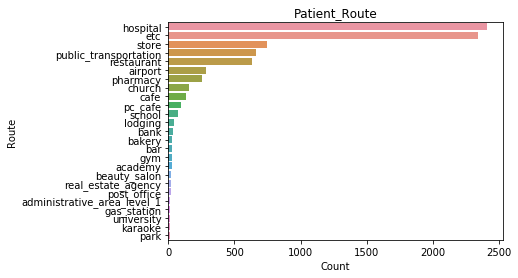

In [36]:
# 감염환자 동선 파악 시각화. (가장 많이 방문한 곳은 어디?)
# 유의미한 방문이니? 유의미하지 않은 방문이니?
res = patient_route.groupby('type').count().sort_values('patient_id',ascending=False)
res = res.reset_index()
res
sns.barplot(y='type',x='patient_id',data=res)
plt.title('Patient_Route')
plt.xlabel('Count')
plt.ylabel('Route')
plt.show()

In [37]:
# 유의미한 변수 추출....
# administrative_area_level_1 이게 뭐지? (국가기관..동사무소같은)
essential = ['hospital','store','public_transportation','pharmacy','bank','school',
             'gas_station','post_office','university','administrative_area_level_1']

In [38]:
# 필수적 / 부수적 여부의 변수 생성 is_essential
def isessential(x):
    if x in essential:
        res = True
    else:
        res = False
    return res
patient_route['is_essential'] = patient_route['type'].apply(isessential)
patient_route

,patient_id,type,latitude,longitude,is_essential
0,1000000001,airport,37.615246,126.715632,False
1,1000000001,hospital,37.567241,127.005659,True
2,1000000002,etc,37.592560,127.017048,False
3,1000000002,store,37.591810,127.016822,True
4,1000000002,public_transportation,37.563992,127.029534,True
...,...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474,False
8088,6100000090,airport,35.173220,128.946459,False
8089,6100000090,store,35.336944,129.026389,True
8090,6100000090,hospital,35.335757,129.025003,True


In [39]:
display(patient_info)
display(patient_route)

,patient_id,sex,age,country,province,infection_case,contact_number,state,infection_cause
0,1000000001,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
1,1000000002,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
2,1000000003,male,50s,Korea,Seoul,contact with patient,17,released,Individual
3,1000000004,male,20s,Korea,Seoul,overseas inflow,9,released,Overseas
4,1000000005,female,20s,Korea,Seoul,contact with patient,2,released,Individual
...,...,...,...,...,...,...,...,...,...
3999,7000000010,female,20s,Korea,Jeju-do,overseas inflow,18,released,Overseas
4000,7000000011,male,30s,Korea,Jeju-do,contact with patient,5,isolated,Individual
4001,7000000012,female,20s,Korea,Jeju-do,overseas inflow,9,released,Overseas
4002,7000000013,female,10s,China,Jeju-do,overseas inflow,6,released,Overseas


,patient_id,type,latitude,longitude,is_essential
0,1000000001,airport,37.615246,126.715632,False
1,1000000001,hospital,37.567241,127.005659,True
2,1000000002,etc,37.592560,127.017048,False
3,1000000002,store,37.591810,127.016822,True
4,1000000002,public_transportation,37.563992,127.029534,True
...,...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474,False
8088,6100000090,airport,35.173220,128.946459,False
8089,6100000090,store,35.336944,129.026389,True
8090,6100000090,hospital,35.335757,129.025003,True


In [40]:
# 결측치 확인해준다. patient_info 데이터와 patient_route 데이터의 patient_id로 merge
# 연령대 별 위도 경도가 필요. age결측치가 많이 보인다... 결측치 열 삭제 하면 될듯?! 
patient_map_merge = pd.merge(patient_route, patient_info,on='patient_id')
patient_map_merge.isnull().sum()

patient_id            0
type                  0
latitude              0
longitude             0
is_essential          0
sex                1380
age                1380
country               0
province              0
infection_case      434
contact_number     5674
state                 0
infection_cause       0
dtype: int64

In [41]:
patient_map_merge.shape

(8092, 13)

In [42]:
# age의 유니크한 값들 확인 nan 값 확인 할 수 있습니다. nan값을 가진 열은 모두 삭제 할거야.
patient_map_merge['age'].unique()

array(['50s', '30s', '20s', '60s', '80s', '70s', '40s', '10s', '90s',
       '0s', nan], dtype=object)

In [43]:
patient_map_merge = patient_map_merge.dropna(subset=['age'], how='any', axis=0).reset_index(drop=True)

In [44]:
patient_map_merge

,patient_id,type,latitude,longitude,is_essential,sex,age,country,province,infection_case,contact_number,state,infection_cause
0,1000000001,airport,37.615246,126.715632,False,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
1,1000000001,hospital,37.567241,127.005659,True,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
2,1000000002,etc,37.592560,127.017048,False,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
3,1000000002,store,37.591810,127.016822,True,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
4,1000000002,public_transportation,37.563992,127.029534,True,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6707,6100000090,airport,37.558654,126.794474,False,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6708,6100000090,airport,35.173220,128.946459,False,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6709,6100000090,store,35.336944,129.026389,True,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6710,6100000090,hospital,35.335757,129.025003,True,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas


In [45]:
map_20s = patient_map_merge[patient_map_merge['age'] == '20s']
display(map_20s)
map_20s = map_20s[['patient_id','type','latitude','longitude','age']]
map_20s

,patient_id,type,latitude,longitude,is_essential,sex,age,country,province,infection_case,contact_number,state,infection_cause
17,1000000004,hospital,37.612772,127.098167,True,male,20s,Korea,Seoul,overseas inflow,9,released,Overseas
18,1000000005,hospital,37.612772,127.098167,True,female,20s,Korea,Seoul,contact with patient,2,released,Individual
20,1000000007,beauty_salon,37.641141,126.791968,False,male,20s,Korea,Seoul,contact with patient,0,released,Individual
21,1000000008,hospital,37.567241,127.005659,True,male,20s,Korea,Seoul,overseas inflow,0,released,Overseas
85,1000000018,etc,37.608987,126.928346,False,male,20s,Korea,Seoul,etc,NaN,released,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6698,6100000088,etc,35.235299,128.670257,False,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown
6699,6100000088,etc,35.234828,128.669467,False,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown
6700,6100000088,pharmacy,35.236901,128.642847,True,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown
6701,6100000088,bakery,35.236140,128.675229,False,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown


,patient_id,type,latitude,longitude,age
17,1000000004,hospital,37.612772,127.098167,20s
18,1000000005,hospital,37.612772,127.098167,20s
20,1000000007,beauty_salon,37.641141,126.791968,20s
21,1000000008,hospital,37.567241,127.005659,20s
85,1000000018,etc,37.608987,126.928346,20s
...,...,...,...,...,...
6698,6100000088,etc,35.235299,128.670257,20s
6699,6100000088,etc,35.234828,128.669467,20s
6700,6100000088,pharmacy,35.236901,128.642847,20s
6701,6100000088,bakery,35.236140,128.675229,20s


In [46]:
# 연령대별 전처리 과정...
map_20s = patient_map_merge[patient_map_merge['age'] == '20s']
map_20s = map_20s[['patient_id','type','latitude','longitude','age']]

map_30s = patient_map_merge[patient_map_merge['age'] == '30s']
map_30s = map_30s[['patient_id','type','latitude','longitude','age']]

map_40s = patient_map_merge[patient_map_merge['age'] == '40s']
map_40s = map_40s[['patient_id','type','latitude','longitude','age']]

map_50s = patient_map_merge[patient_map_merge['age'] == '50s']
map_50s = map_50s[['patient_id','type','latitude','longitude','age']]

map_60s = patient_map_merge[patient_map_merge['age'] == '60s']
map_60s = map_60s[['patient_id','type','latitude','longitude','age']]

map_70s = patient_map_merge[patient_map_merge['age'] == '70s']
map_70s = map_70s[['patient_id','type','latitude','longitude','age']]
map_30s

,patient_id,type,latitude,longitude,age
2,1000000002,etc,37.592560,127.017048,30s
3,1000000002,store,37.591810,127.016822,30s
4,1000000002,public_transportation,37.563992,127.029534,30s
5,1000000002,public_transportation,37.590330,127.015221,30s
6,1000000002,store,37.589590,127.009766,30s
...,...,...,...,...,...
6588,6100000061,store,35.544556,128.492214,30s
6589,6100000061,cafe,35.541315,128.500770,30s
6590,6100000061,etc,35.541315,128.500770,30s
6591,6100000061,hospital,35.543652,128.490086,30s


In [47]:
# 20~30대 확진자 경로 // 40~50대 확진자 경로 // 60~70대 확진자 경로
# 20~30 파랑색 // 40~50 빨강색 // 60~70 초록색

loc = [37.5502, 126.982]
map_20s_size = len(map_20s)
map_30s_size = len(map_30s)
map_40s_size = len(map_40s)
map_50s_size = len(map_50s)
map_60s_size = len(map_60s)
map_70s_size = len(map_70s)

result_map = folium.Map(location=loc, zoom_start=13)

for i in range(map_20s_size):
    folium.Circle(list(map_20s.iloc[i][['latitude','longitude']]),
                 popup=map_20s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#0000DB',color='#0000DB').add_to(result_map)

for i in range(map_30s_size):
    folium.Circle(list(map_30s.iloc[i][['latitude','longitude']]),
                 popup=map_30s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='##0000DB',color='##0000DB').add_to(result_map)

for i in range(map_40s_size):
    folium.Circle(list(map_40s.iloc[i][['latitude','longitude']]),
                 popup=map_40s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#FF0000',color='#FF0000').add_to(result_map)
    
for i in range(map_50s_size):
    folium.Circle(list(map_50s.iloc[i][['latitude','longitude']]),
                 popup=map_50s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#FF0000',color='#FF0000').add_to(result_map)
    
for i in range(map_60s_size):
    folium.Circle(list(map_60s.iloc[i][['latitude','longitude']]),
                 popup=map_60s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#006F00',color='#006F00').add_to(result_map)
    
for i in range(map_70s_size):
    folium.Circle(list(map_70s.iloc[i][['latitude','longitude']]),
                 popup=map_70s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#006F00',color='#006F00').add_to(result_map)
result_map

In [48]:
patient_route.groupby('patient_id')['is_essential']

In [49]:
patient_route['route_value'] = 1
print(patient_route)
result_route = pd.pivot_table(data=patient_route, index='patient_id',
                               columns='is_essential',values='route_value',
                               aggfunc='sum', fill_value=0)
result_route

      patient_id                   type   latitude   longitude  is_essential  \
0     1000000001                airport  37.615246  126.715632         False   
1     1000000001               hospital  37.567241  127.005659          True   
2     1000000002                    etc  37.592560  127.017048         False   
3     1000000002                  store  37.591810  127.016822          True   
4     1000000002  public_transportation  37.563992  127.029534          True   
...          ...                    ...        ...         ...           ...   
8087  6100000090                airport  37.558654  126.794474         False   
8088  6100000090                airport  35.173220  128.946459         False   
8089  6100000090                  store  35.336944  129.026389          True   
8090  6100000090               hospital  35.335757  129.025003          True   
8091  6100000090                  store  35.336944  129.026389          True   

      route_value  
0               1  

is_essential,False,True
patient_id,,
1000000001,1,1
1000000002,4,9
1000000003,2,0
1000000004,0,1
1000000005,0,1
...,...,...
6100000086,1,3
6100000087,2,6
6100000088,19,5


In [50]:
# 컬럼명 재설정
result_route.columns.name=None
result_route = result_route.reset_index()
result_route = result_route.rename(columns={False:'non_essential',True:'essential'})
result_route

,patient_id,non_essential,essential
0,1000000001,1,1
1,1000000002,4,9
2,1000000003,2,0
3,1000000004,0,1
4,1000000005,0,1
...,...,...,...
1467,6100000086,1,3
1468,6100000087,2,6
1469,6100000088,19,5
1470,6100000089,1,1


In [51]:
patient_merge = patient_info.merge(result_route, left_on='patient_id', right_on='patient_id', how='inner')
patient_merge

,patient_id,sex,age,country,province,infection_case,contact_number,state,infection_cause,non_essential,essential
0,1000000001,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas,1,1
1,1000000002,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas,4,9
2,1000000003,male,50s,Korea,Seoul,contact with patient,17,released,Individual,2,0
3,1000000004,male,20s,Korea,Seoul,overseas inflow,9,released,Overseas,0,1
4,1000000005,female,20s,Korea,Seoul,contact with patient,2,released,Individual,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1467,6100000086,male,50s,Korea,Gyeongsangnam-do,etc,NaN,isolated,Unknown,1,3
1468,6100000087,female,50s,Korea,Gyeongsangnam-do,etc,NaN,isolated,Unknown,2,6
1469,6100000088,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown,19,5
1470,6100000089,male,60s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown,1,1


,age,non_essential,essential
0,0s,26,46
1,10s,172,181
2,20s,1009,889
3,30s,516,540
4,40s,567,560
5,50s,578,640
6,60s,363,352
7,70s,87,107
8,80s,10,61
9,90s,2,6


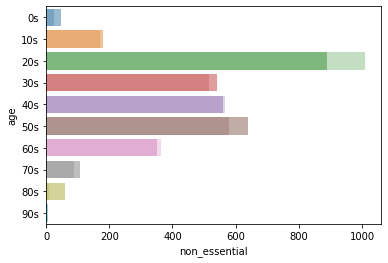

In [52]:
# 나이대별 필요한곳 방문한 경우 // 필요하지 않은곳 방문한 경우
age_essential = patient_merge.groupby('age')[['non_essential','essential']].sum()
age_essential = age_essential.reset_index()
display(age_essential)
sns.barplot(y='age', x='essential', data=age_essential, alpha=0.5)
sns.barplot(y='age', x='non_essential' ,data=age_essential, alpha=0.3)
plt.show()

In [73]:
age_essential

,age,non_essential,essential
0,0s,26,46
1,10s,172,181
2,20s,1009,889
3,30s,516,540
4,40s,567,560
5,50s,578,640
6,60s,363,352
7,70s,87,107
8,80s,10,61
9,90s,2,6


,age
0,0s
1,10s
2,20s
3,30s
4,40s
5,50s
6,60s
7,70s
8,80s
9,90s


,age,value
0,0s,46
1,10s,181
2,20s,889
3,30s,540
4,40s,560
5,50s,640
6,60s,352
7,70s,107
8,80s,61
9,90s,6


,age,value,is_essential
0,0s,46,True
1,10s,181,True
2,20s,889,True
3,30s,540,True
4,40s,560,True
5,50s,640,True
6,60s,352,True
7,70s,107,True
8,80s,61,True
9,90s,6,True


,age,value,is_essential
0,0s,46,True
1,10s,181,True
2,20s,889,True
3,30s,540,True
4,40s,560,True
5,50s,640,True
6,60s,352,True
7,70s,107,True
8,80s,61,True
9,90s,6,True


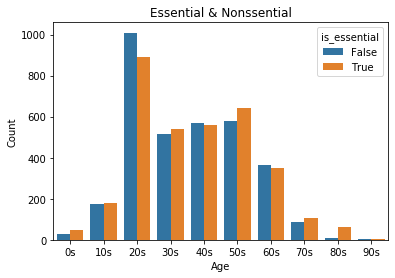

In [67]:
# 새로운 데이터 프레임을 만들어서 내가 다루기 쉽게 만들어 준다.
age_e = pd.DataFrame(age_essential['age'], columns=['age'])
display(age_e)
age_e['value'] = age_essential['essential']
display(age_e)
age_e['is_essential'] = True
display(age_e)

age_n = pd.DataFrame(age_essential['age'], columns=['age'])
age_n['value'] = age_essential['non_essential']
age_n['is_essential'] = False
age_n

age = age_e.append(age_n, ignore_index='True')
display(age)

sns.barplot(data=age,x='age',y='value',hue='is_essential')
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Essential & Nonssential')
plt.show()

    age   is_essential  value
0    0s  non_essential     26
1    0s      essential     46
2   10s  non_essential    172
3   10s      essential    181
4   20s  non_essential   1009
5   20s      essential    889
6   30s  non_essential    516
7   30s      essential    540
8   40s  non_essential    567
9   40s      essential    560
10  50s  non_essential    578
11  50s      essential    640
12  60s  non_essential    363
13  60s      essential    352
14  70s  non_essential     87
15  70s      essential    107
16  80s  non_essential     10
17  80s      essential     61
18  90s  non_essential      2
19  90s      essential      6


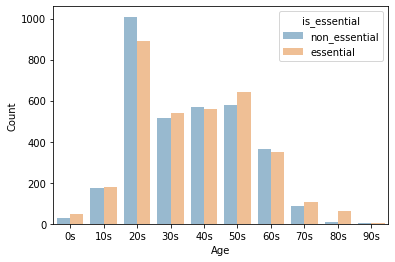

In [54]:
# 해답 찾기전까진 일단 노가다 구현...[0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1],
# 0불필요한곳(non_essential) // 1필요한곳(essential)
data = {
    'age':['0s','0s','10s','10s','20s','20s','30s','30s','40s','40s','50s','50s',
           '60s','60s','70s','70s','80s','80s','90s','90s'],
    'is_essential':  ['non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential',
  'non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential'],
    'value':[26,46,172,181,1009,889,516,540,567,560,578,640,363,352,87,107,10,61,2,6]
}
example = pd.DataFrame(data)
print(example)
sns.barplot(y='value',x='age', hue='is_essential', data=example, alpha=0.5)
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()
# sns.barplot(y='age', x='non_essential' ,data=age_essential, alpha=0.3)

# 서울 유동인구 데이터.

In [55]:
seoul_floating = pd.read_csv('SeoulFloating.csv')
seoul_floating

,date,hour,birth_year,sex,province,city,fp_num
0,2020-01-01,0,20,female,Seoul,Dobong-gu,19140
1,2020-01-01,0,20,male,Seoul,Dobong-gu,19950
2,2020-01-01,0,20,female,Seoul,Dongdaemun-gu,25450
3,2020-01-01,0,20,male,Seoul,Dongdaemun-gu,27050
4,2020-01-01,0,20,female,Seoul,Dongjag-gu,28880
...,...,...,...,...,...,...,...
863995,2020-04-30,22,40,female,Seoul,Seongdong-gu,22150
863996,2020-04-30,22,50,female,Seoul,Seodaemun-gu,23270
863997,2020-04-30,23,20,female,Seoul,Yongsan-gu,18570
863998,2020-04-30,23,30,female,Seoul,Seodaemun-gu,21100


In [83]:
# 그래프 그리기 위해 다시 한번 전처리 과정
# age_m moring을 age별로 전처리한 변수
# age_n = pd.DataFrame(age_essential['age'], columns=['age'])
# age_n['value'] = age_essential['non_essential']
# age_n['is_essential'] = False
# age_n
# display(seoul_floating)
# display(seoul_floating['birth_year'].unique())
age_m = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
display(age_m)
moring_floating = seoul_floating[(seoul_floating['hour'] > 5) & (seoul_floating['hour'] < 12)].reset_index(drop=True)
display(moring_floating.head(20))
age_m['value'] = moring_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
# display(age_m)
age_m['is_time'] = 'moring'
# display(age_m)

# age_a afternoon을 age별로 전처리한 변수
age_a = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
afternoon_floating = seoul_floating[(seoul_floating['hour'] > 11) & (seoul_floating['hour'] < 18)].reset_index(drop=True)
age_a['value'] = afternoon_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
age_a['is_time'] = 'afternoon'
# display(age_a)

# age_e evening을 age별로 전처리한 변수
age_e = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
evening_floating = seoul_floating[(seoul_floating['hour'] > 17) & (seoul_floating['hour'] < 24)].reset_index(drop=True)
age_e['value'] = evening_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
age_e['is_time'] = 'evening'
# display(age_e)

# 각각의 데이터를 밑에다 붙이는 방법 (다른 방법도 있는 듯 함...) ignore_index=True 는 index값 초기화 시키는 것
result_floating_data = age_m.append(age_a, ignore_index=True)
result_floating_data = result_floating_data.append(age_e, ignore_index=True)
result_floating_data

,age
0,20
1,30
2,40
3,50
4,60
5,70


,date,hour,birth_year,sex,province,city,fp_num
0,2020-01-01,6,20,female,Seoul,Dobong-gu,20750
1,2020-01-01,6,20,male,Seoul,Dobong-gu,22390
2,2020-01-01,6,20,female,Seoul,Dongdaemun-gu,25370
3,2020-01-01,6,20,male,Seoul,Dongdaemun-gu,27520
4,2020-01-01,6,20,female,Seoul,Dongjag-gu,28680
5,2020-01-01,6,20,male,Seoul,Dongjag-gu,30270
6,2020-01-01,6,20,female,Seoul,Eunpyeong-gu,28700
7,2020-01-01,6,20,male,Seoul,Eunpyeong-gu,28830
8,2020-01-01,6,20,female,Seoul,Gangbuk-gu,19330
9,2020-01-01,6,20,male,Seoul,Gangbuk-gu,21100


,age,value,is_time
0,20,1078632280,moring
1,30,1220158040,moring
2,40,1218249140,moring
3,50,1132617670,moring
4,60,739455960,moring
5,70,561473150,moring
6,20,1124395680,afternoon
7,30,1254346990,afternoon
8,40,1242457850,afternoon
9,50,1140309850,afternoon


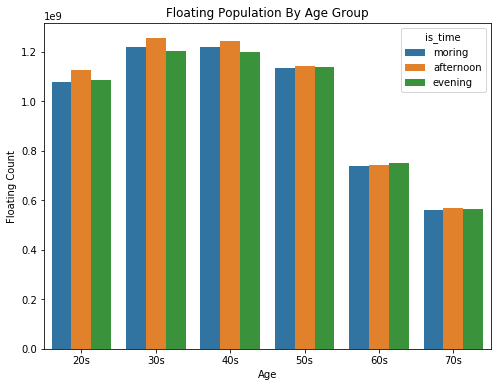

In [72]:
fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=result_floating_data, x='age',y='value',hue='is_time')
ax.set(xticklabels=['20s','30s','40s','50s','60s','70s'])
plt.xlabel('Age')
plt.ylabel('Floating Count')
plt.title('Floating Population By Age Group')
plt.show()

In [58]:
# 분명... for문 돌리는 방법이 있다.. 생각해보자.(생각나진 않지만.. 혹시 아시나요??)
# 출력해보면 새벽 유동인구 데이터는 존재하지 않는 다는 것을 확인 할 수 있다.

floating_20s = seoul_floating[seoul_floating['birth_year']==20]
moring_floating_20s = floating_20s[(floating_20s['hour'] > 5) & (floating_20s['hour'] < 12)]
afternoon_floating_20s = floating_20s[(floating_20s['hour'] > 11) & (floating_20s['hour'] < 18)]
evening_floating_20s = floating_20s[(floating_20s['hour'] > 17) & (floating_20s['hour'] < 24)]
# dwan_floating_20s = floating_20s[(floating_20s['hour'] > 23) & (floating_20s['hour'] < 6)]
print(moring_floating_20s['fp_num'].sum())
print(afternoon_floating_20s['fp_num'].sum())
print(evening_floating_20s['fp_num'].sum())
# print(dwan_floating_20s['fp_num'].sum())

floating_30s = seoul_floating[seoul_floating['birth_year']==30]
moring_floating_30s = floating_30s[(floating_30s['hour'] > 5) & (floating_30s['hour'] < 12)]
afternoon_floating_30s = floating_30s[(floating_30s['hour'] > 11) & (floating_30s['hour'] < 18)]
evening_floating_30s = floating_30s[(floating_30s['hour'] > 17) & (floating_30s['hour'] < 24)]
# dwan_floating_30s = floating_30s[(floating_30s['hour'] > 23) & (floating_30s['hour'] < 6)]
print(moring_floating_30s['fp_num'].sum())
print(afternoon_floating_30s['fp_num'].sum())
print(evening_floating_30s['fp_num'].sum())
# print(dwan_floating_30s['fp_num'].sum())

floating_40s = seoul_floating[seoul_floating['birth_year']==40]
moring_floating_40s = floating_40s[(floating_40s['hour'] > 5) & (floating_40s['hour'] < 12)]
afternoon_floating_40s = floating_40s[(floating_40s['hour'] > 11) & (floating_40s['hour'] < 18)]
evening_floating_40s = floating_40s[(floating_40s['hour'] > 17) & (floating_40s['hour'] < 24)]
# dwan_floating_40s = floating_40s[(floating_40s['hour'] > 23) & (floating_40s['hour'] < 6)]
print(moring_floating_40s['fp_num'].sum())
print(afternoon_floating_40s['fp_num'].sum())
print(evening_floating_40s['fp_num'].sum())
# print(dwan_floating_40s['fp_num'].sum())

floating_50s = seoul_floating[seoul_floating['birth_year']==50]
moring_floating_50s = floating_50s[(floating_50s['hour'] > 5) & (floating_50s['hour'] < 12)]
afternoon_floating_50s = floating_50s[(floating_50s['hour'] > 11) & (floating_50s['hour'] < 18)]
evening_floating_50s = floating_50s[(floating_50s['hour'] > 17) & (floating_50s['hour'] < 24)]
# dwan_floating_50s = floating_50s[(floating_50s['hour'] > 23) & (floating_50s['hour'] < 6)]
print(moring_floating_50s['fp_num'].sum())
print(afternoon_floating_50s['fp_num'].sum())
print(evening_floating_50s['fp_num'].sum())
# print(dwan_floating_50s['fp_num'].sum())

floating_60s = seoul_floating[seoul_floating['birth_year']==60]
moring_floating_60s = floating_60s[(floating_60s['hour'] > 5) & (floating_60s['hour'] < 12)]
afternoon_floating_60s = floating_60s[(floating_60s['hour'] > 11) & (floating_60s['hour'] < 18)]
evening_floating_60s = floating_60s[(floating_60s['hour'] > 17) & (floating_60s['hour'] < 24)]
# dwan_floating_60s = floating_60s[(floating_60s['hour'] > 23) & (floating_60s['hour'] < 6)]
print(moring_floating_60s['fp_num'].sum())
print(afternoon_floating_60s['fp_num'].sum())
print(evening_floating_60s['fp_num'].sum())
# print(dwan_floating_60s['fp_num'].sum())

floating_70s = seoul_floating[seoul_floating['birth_year']==70]
moring_floating_70s = floating_70s[(floating_70s['hour'] > 5) & (floating_70s['hour'] < 12)]
afternoon_floating_70s = floating_70s[(floating_70s['hour'] > 11) & (floating_70s['hour'] < 18)]
evening_floating_70s = floating_70s[(floating_70s['hour'] > 17) & (floating_70s['hour'] < 24)]
# dwan_floating_70s = floating_70s[(floating_70s['hour'] > 23) & (floating_70s['hour'] < 6)]
print(moring_floating_70s['fp_num'].sum())
print(afternoon_floating_70s['fp_num'].sum())
print(evening_floating_70s['fp_num'].sum())
# print(dwan_floating_70s['fp_num'].sum())


1078632280
1124395680
1085115460
1220158040
1254346990
1201191780
1218249140
1242457850
1200332980
1132617670
1140309850
1136056590
739455960
741915590
749214590
561473150
567672950
564214280


    age       time       value
0   20s     moring  1078632280
1   20s  afternoon  1124395680
2   20s    evening  1085115460
3   30s     moring  1220158040
4   30s  afternoon  1254346990
5   30s    evening  1201191780
6   40s     moring  1218249140
7   40s  afternoon  1242457850
8   40s    evening  1200332980
9   50s     moring  1132617670
10  50s  afternoon  1140309850
11  50s    evening  1136056590
12  60s     moring   739455960
13  60s  afternoon   741915590
14  60s    evening   749214590
15  70s     moring   561473150
16  70s  afternoon   567672950
17  70s    evening   564214280


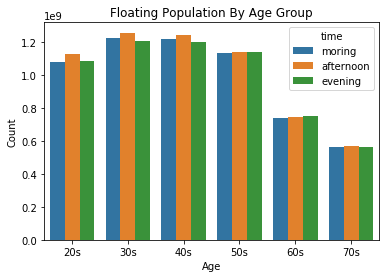

In [59]:
# 연령대별 오전 유동인구 시각화
# 'moring','afternoon','evening'
time_data = {
    'age':['20s','20s','20s','30s','30s','30s','40s','40s','40s','50s','50s','50s','60s','60s','60s','70s','70s','70s'],
    'time':['moring','afternoon','evening','moring','afternoon','evening','moring','afternoon','evening','moring','afternoon','evening','moring','afternoon','evening','moring','afternoon','evening'],
    'value':[moring_floating_20s['fp_num'].sum(), afternoon_floating_20s['fp_num'].sum(), evening_floating_20s['fp_num'].sum(),
             moring_floating_30s['fp_num'].sum(), afternoon_floating_30s['fp_num'].sum(), evening_floating_30s['fp_num'].sum(),
             moring_floating_40s['fp_num'].sum(), afternoon_floating_40s['fp_num'].sum(), evening_floating_40s['fp_num'].sum(),
             moring_floating_50s['fp_num'].sum(), afternoon_floating_50s['fp_num'].sum(), evening_floating_50s['fp_num'].sum(),
             moring_floating_60s['fp_num'].sum(), afternoon_floating_60s['fp_num'].sum(), evening_floating_60s['fp_num'].sum(),
             moring_floating_70s['fp_num'].sum(), afternoon_floating_70s['fp_num'].sum(), evening_floating_70s['fp_num'].sum()]
}
time_floating = pd.DataFrame(time_data)
print(time_floating)

sns.barplot(y='value', x='age', hue='time', data=time_floating)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Floating Population By Age Group')
plt.show()


In [60]:
# 질문! 요거 for문 돌리는 방법이....? 
# 20에 해당하는 부분을 30, 40, 50, 60 ,70 각 각 넣어서 변수에 담고 싶어요!!!

for i in range(20,80,10):
    floating_20s = seoul_floating[seoul_floating['birth_year']==20]
    moring_floating_20s = floating_20s[(floating_20s['hour'] > 5) & (floating_20s['hour'] < 12)]
    afternoon_floating_20s = floating_20s[(floating_20s['hour'] > 11) & (floating_20s['hour'] < 18)]
    evening_floating_20s = floating_20s[(floating_20s['hour'] > 17) & (floating_20s['hour'] < 24)]
#     dwan_floating_20s = floating_20s[(floating_20s['hour'] > 23) & (floating_20s['hour'] < 6)]
    print(moring_floating_20s['fp_num'].sum())
    print(afternoon_floating_20s['fp_num'].sum())
    print(evening_floating_20s['fp_num'].sum())
    # print(dwan_floating_20s['fp_num'].sum())

1078632280
1124395680
1085115460
1078632280
1124395680
1085115460
1078632280
1124395680
1085115460
1078632280
1124395680
1085115460
1078632280
1124395680
1085115460
1078632280
1124395680
1085115460
